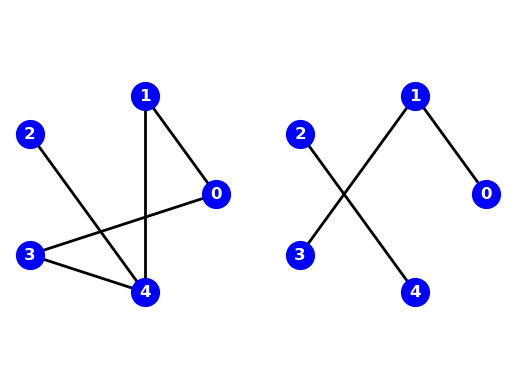

In [1]:
#Constructing the Graph of Friendships Example

import networkx as nx
import matplotlib.pyplot as plt

#Initialising a graph of Classmates
classmateGraph = nx.Graph()
classmateGraph.add_nodes_from([i for i in range(0,5)])

#Creating a graph of Classmates
classmateEdges = [(0,1), (0,3), (1,4), (2,4), (3,4)]
classmateGraph.add_edges_from(classmateEdges)


#Initialising a graph of Friends
friendsGraph = nx.Graph()
friendsGraph.add_nodes_from([i for i in range(0,5)])

#Creating a final graph of Friends
friendEdges = [(0,1), (1,3), (2,4)]
friendsGraph.add_edges_from(friendEdges)

#Initialize graph-drawing options
options = {
    'node_color': 'blue',
    'node_size': 400,
    'width': 2,
    'with_labels': True, 
    'font_color': 'white',
    'font_weight': 'bold',
}

#Outputing the graph side by side

fig, axs = plt.subplots(1, 2)
axs[0].axis('equal')
axs[1].axis('equal')

nx.draw_circular(classmateGraph, ax = axs[0], **options)
nx.draw_circular(friendsGraph, ax = axs[1], **options)

plt.savefig('test.jpg')



In [2]:
#Defining the PMF of random variable X_i

def PMF_Xi(x):  #PMF of random variable Xi
    if x==0: 
        return 3/93
    elif x==1 or x==2 or x==3: 
        return 5/93
    elif x==4 or x==5 or x==6: 
        return 23/(3*93)
    elif x==7 or x==8 or x==9 or x==10: 
        return 5/93
    elif x>=11 and x<=15: 
        return 12/(5*93)
    elif x>=16 and x<=25: 
        return 11/(10*93)
    elif x>=26 and x<=50: 
        return 6/(25*93)
    elif x>=51 and x<=100:
        return 1/(25*93)
    elif x>200 and x<=210: 
        return 1/(11*93)
    else: 
        return 0

In [3]:
#Finding the Probability that node i is Classmates/Friends with node j

#Initialisation
PiCj = 20.3/210       #Naive Def of Probability
PiFj = 0

for _ in range(0,211): 
    PiFj += PMF_Xi(_)*(_/210)   #Using Law of Total Probability
    
print('Probability that i is classmates with j:', PiCj)
print('Probability that i is friends with j:', PiFj)

Probability that i is classmates with j: 0.09666666666666666
Probability that i is friends with j: 0.06463482753805334


In [4]:
#Generating a network of arbitrary secondary school: Classmates and Friends

import numpy as np
import random as rd

#Initialisation of Classmates and Friends:
classmate_list = []
friends_list = []
iteration_num = 0

#Generating list of Classmates of form (i,j): 
for i in range(0,211): 
    for j in range(i+1, 211): 
        iteration_num += 1
        if rd.random() < PiCj: 
            classmate_list.append((i,j))

#Generating list of Friends of form (i,j): 
for i in range(0,211): 
    for j in range(i+1, 211): 
        if rd.random() < PiFj: 
            friends_list.append((i,j))

print('Theoretical Maximum Length:', iteration_num)
print('Number of Classmate pairings:', len(classmate_list))
print('Number of Friends pairings:', len(friends_list))

#Generating matricies of true or false depending on friendship
#If i and j are classmates, then the ij th and the ji th entry show True

#Initialisation
classmate_Matrix = np.full((211,211), False)
friends_Matrix = np.full((211,211), False)

#Changing the matrix values to True for the ijth and the jith entry
for _ in classmate_list: 
    classmate_Matrix[_[0],_[1]] = True
    classmate_Matrix[_[1],_[0]] = True
    
for _ in friends_list: 
    friends_Matrix[_[0],_[1]] = True
    friends_Matrix[_[1],_[0]] = True

Theoretical Maximum Length: 22155
Number of Classmate pairings: 2190
Number of Friends pairings: 1465


In [5]:
#Defining functions to find array of friends and classmates of person i
#This function is such that if i is both classmates and friends with person i, 
#the resultant array only shows true in the friends array. 

def classmates_friends(i, classmate_Matrix, friends_Matrix): 
    
    #Extract ith row of matrix
    friends_array = friends_Matrix[i]
    classmate_array = classmate_Matrix[i]
    
    #Remove the True from classmate_array for people who are both friends and classmates with i. 
    classmate_array = ~friends_array & classmate_array
    
    return (classmate_array, friends_array)

classmates_friends(0, classmate_Matrix, friends_Matrix)[0]

array([False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False,  True,  True, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False,  True,
       False, False, False,  True, False,  True, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False,  True, False, False,
       False, False,

In [128]:

def update_Step(S, num, temp, classmate_Matrix, friends_Matrix, positive = False, rumour_student = -1): 
        
    #Set coefficients for Hamilton Function
    
    #New Issue - if e-25 is not added the simulation runs into error - number too larger
    #Partially due to boltzmann constant
    if positive == False: 
        Jff = 2.62e-1/0.5
        Jfc = 2.48e-1/0.5
        Jcf = 2.19e-1/0.5
        Jcc = 2.67e-1/0.5
    else: 
        Jff = 3.55e-1/0.5
        Jfc = 3.73e-1/0.5
        Jcf = 3.63e-1/0.5
        Jcc = 3.56e-1/0.5

    
    #Pick random node to update
    i = rd.randint(0, num-1)
    
    #Find array of classmates and friends
    classmates_friends_array = classmates_friends(i, classmate_Matrix, friends_Matrix)
    fr_i = classmates_friends_array[1]
    cl_i = classmates_friends_array[0]
    
    #Find change in energy
    dE = 0
    
    if rumour_student == -1 or rumour_student >= num:  #Rumour not about anyone in yeargroup
        dE += np.sum(Jfc*S[fr_i]*S[i])
        dE += np.sum(Jcc*S[cl_i]*S[i])
    else: 
        fr_cl_arr = classmates_friends(rumour_student, classmate_Matrix, friends_Matrix)
        fr_j = fr_cl_arr[1]
        
        dE += np.sum(Jff*S[fr_i&fr_j]*S[i])
        dE += np.sum(Jfc*S[fr_i&~fr_j]*S[i])
        dE += np.sum(Jcf*S[cl_i&fr_j]*S[i])
        dE += np.sum(Jcc*S[cl_i&~fr_j]*S[i])
            
    dE = 2*dE
    
    #Decide if the state is flipped
    if rd.random() < 1/(1+np.exp(dE/temp)): 
        S[i] *= -1
    
    return S
    

In [7]:
#Defining the simulation function

def rumour_Simulation(S, num, freq, temp, classmate_Matrix, friends_Matrix, positive = False, rumour_student = -1):
    
    #Run the simulation for freq number of times
    for _ in range(freq): 
        S = update_Step(S, num, temp, classmate_Matrix, friends_Matrix, positive, rumour_student)
    
    #Return resultant state
    return S

In [8]:
#Testing on 5 nodes

S = np.ones(5)
classmate_list1 = [(0,1), (0,3), (1,4), (2,4), (3,4)]
friends_list1 = [(0,1), (1,3), (2,4)]

classmate_Matrix1 = np.full((5,5), False)
friends_Matrix1 = np.full((5,5), False)

for _ in classmate_list1: 
    classmate_Matrix1[_[0],_[1]] = True
    classmate_Matrix1[_[1],_[0]] = True
    
for _ in friends_list1: 
    friends_Matrix1[_[0],_[1]] = True
    friends_Matrix1[_[1],_[0]] = True

rumour_Simulation(S, 5, 1000, 10, classmate_Matrix1, friends_Matrix1)

array([-1.,  1., -1., -1., -1.])

In [9]:
#Testing on 211 nodes

S = np.array([1 for i in range(211)])

rumour_Simulation(S, 211, 1000, 10, classmate_Matrix, friends_Matrix)

array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1, -1, -1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1, -1, -1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1])

In [62]:
#Defining the energy function

def H(S, num, classmate_Matrix, friends_Matrix, positive = False, rumour_student = -1): 
    
    #Initialisation
    energy = 0
    
    #If rumour not about anybody in the class
    if rumour_student == -1 or rumour_student >= num: 
        #If a negative rumour
        if positive == False: 
            energy -= 2.67e-1/0.5*np.sum(np.matmul((classmate_Matrix*S),S))
            energy -= 2.48e-1/0.5*np.sum(np.matmul((friends_Matrix*S),S))
            energy /= 2
        #Positive rumour
        else: 
            energy -= 3.56e-1/0.5*np.sum(np.matmul((classmate_Matrix*S),S))
            energy -= 3.73e-1/0.5*np.sum(np.matmul((friends_Matrix*S),S))
            energy /= 2
    else: 
        fr_j = classmates_friends(rumour_student, classmate_Matrix, friends_Matrix)[1]
        nfr_j = ~fr_j
        #If a negative rumour
        if positive == False: 
            energy -= 2.19e-1/0.5*np.sum(np.matmul((classmate_Matrix*S*fr_j),S))
            energy -= 2.67e-1/0.5*np.sum(np.matmul((classmate_Matrix*S*nfr_j),S))
            energy -= 2.62e-1/0.5*np.sum(np.matmul((friends_Matrix*S*fr_j),S))
            energy -= 2.48e-1/0.5*np.sum(np.matmul((friends_Matrix*S*nfr_j),S))
            energy /= 2
        #Positive rumour
        else: 
            energy -= 3.63e-1/0.5*np.sum(np.matmul((classmate_Matrix*S*fr_j),S))
            energy -= 3.56e-1/0.5*np.sum(np.matmul((classmate_Matrix*S*nfr_j),S))
            energy -= 3.55e-1/0.5*np.sum(np.matmul((friends_Matrix*S*fr_j),S))
            energy -= 3.73e-1/0.5*np.sum(np.matmul((friends_Matrix*S*nfr_j),S))
            energy /= 2
    return energy


#Function to find the survival probability of rumour student

def survivalProb(num, freq, temp, classmate_Matrix, friends_Matrix, positive = False, rumour_student = -1): 
    
    #Initialisation
    p = 0
    Z = 0
    beta = 1/(temp)    
    
    #Generating list of S to use for simulation
    rand_num_list = []
    for i in range(1000): 
        rand_num_list.append(rd.randint(0,2**num-1))
    

    #Run each simulation in the list generated above
    for a in rand_num_list: 

        #Find the corresponding state of 1s and -1s for each random number
        S = [_ for _ in bin(a)]
        S = [int(_) for _ in S[2:-1]]
        if a%2 == 0: 
            S.append(0)
        else: 
            S.append(1)
        S = [-1 if _ == 0 else 1 for _ in S]
        while len(S) < num: 
            S.insert(0,-1)
        S = np.array(S)

                
        
        #Run the simulation to find resultant S and if people back student
        resultS = rumour_Simulation(S, num, freq, temp, classmate_Matrix, friends_Matrix, positive, rumour_student)
        Z += np.exp(-H(resultS, num, classmate_Matrix, friends_Matrix, positive, rumour_student)*beta) 
        result = np.sum(resultS)
        if result > 0: 
            p += np.exp(-H(resultS, num, classmate_Matrix, friends_Matrix, positive, rumour_student)*beta) 
    
    p = p/Z
    
    return p


#Testing on 5 nodes
survivalProb(5, 1000, 10, classmate_Matrix1, friends_Matrix1)

#S_testing = np.array([-1 for i in range(211)])

#H(S_testing, 211, classmate_Matrix, friends_Matrix)

0.49599999999998823

In [ ]:
#Testing on 211 nodes
survivalProb(211, 1000, 2.75, classmate_Matrix, friends_Matrix, False, 0)


In [115]:
survivalProbListNeg_ = []
T = [0.2*i for i in range(2,201)]

for temp in T: 
    survivalProbListNeg_.append(survivalProb(211, 3000, temp, classmate_Matrix, friends_Matrix))


survivalProbListPos_ = []

for temp in T: 
    survivalProbListPos_.append(survivalProb(211,3000,temp,classmate_Matrix, friends_Matrix, True))


print('done!--------------------------')

/var/folders/3p/w84v6ygx0s17b7n5xsxtgvt40000gn/T/ipykernel_45041/2811024744.py:74: RuntimeWarning: overflow encountered in exp
  Z += np.exp(-H(resultS, num, classmate_Matrix, friends_Matrix, positive, rumour_student)*beta)
/var/folders/3p/w84v6ygx0s17b7n5xsxtgvt40000gn/T/ipykernel_45041/2811024744.py:77: RuntimeWarning: overflow encountered in exp
  p += np.exp(-H(resultS, num, classmate_Matrix, friends_Matrix, positive, rumour_student)*beta)
/var/folders/3p/w84v6ygx0s17b7n5xsxtgvt40000gn/T/ipykernel_45041/2811024744.py:79: RuntimeWarning: invalid value encountered in scalar divide
  p = p/Z


done!--------------------------


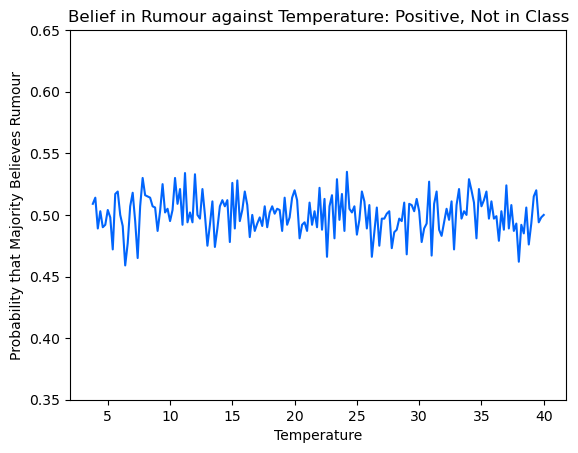

In [126]:
plt.plot(T,survivalProbListPos_, color = '#0165fc')
plt.ylim(0.35,0.65)
plt.xlabel('Temperature')
plt.ylabel('Probability that Majority Believes Rumour')
plt.title('Belief in Rumour against Temperature: Positive, Not in Class')
plt.savefig('Belief in Rumour against Temperature: Positive, Not in Class.png')



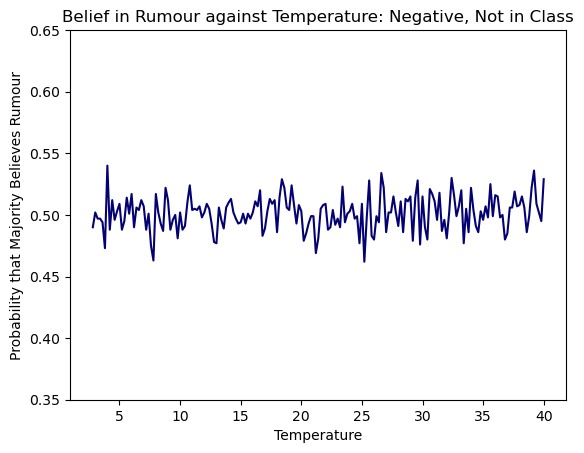

In [127]:
plt.plot(T,survivalProbListNeg_, color = '#040273')
plt.ylim(0.35,0.65)
plt.xlabel('Temperature')
plt.ylabel('Probability that Majority Believes Rumour')
plt.title('Belief in Rumour against Temperature: Negative, Not in Class')
plt.savefig('Belief in Rumour against Temperature: Negative, Not in Class.png')



In [ ]:
plt.hist(survivalProbListPos)

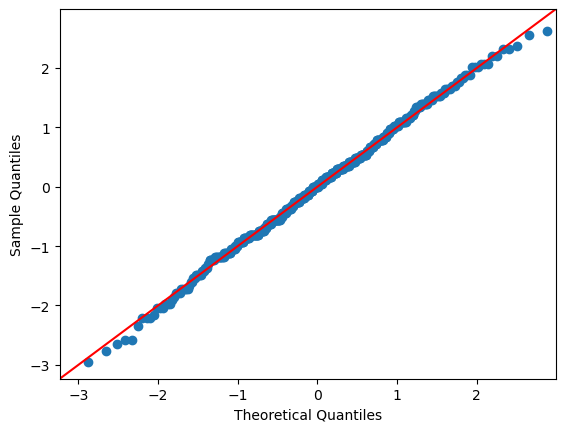

In [108]:
#fixed - able to run later
import statsmodels.api as sm 

survivalProbListPos = []

for _ in range(500): 
    
    survivalProbListPos.append(survivalProb(211, 3000, 10, classmate_Matrix, friends_Matrix, True))

survivalProbListPos1 = [i/(1e20) for i in survivalProbListPos if i >= 0]

meanSurvivalProbPos1 = sum(survivalProbListPos1)/len(survivalProbListPos1)

ms1 = [(i-meanSurvivalProbPos1)**2 for i in survivalProbListPos1]

SSurvivalProbPos1 = (1/(len(survivalProbListPos1)-1) * sum(ms1))**(1/2)

survivalProbPosStandardised1 = np.array([(x-meanSurvivalProbPos1)/SSurvivalProbPos1 for x in survivalProbListPos1])

sm.qqplot(survivalProbPosStandardised1, line ='45')

plt.savefig('test1.png')

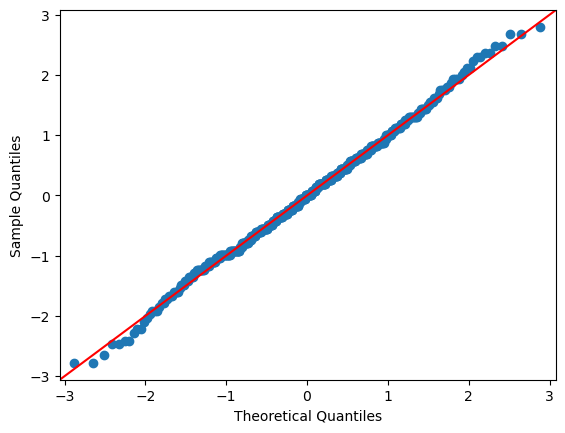

In [111]:
survivalProbListNeg = []

for _ in range(500): 

        survivalProbListNeg.append(survivalProb(211, 3000, 10, classmate_Matrix, friends_Matrix))

survivalProbListNeg1 = [i/(1e20) for i in survivalProbListNeg if i >= 0]

meanSurvivalProbNeg1 = sum(survivalProbListNeg1)/len(survivalProbListNeg1)

ms2 = [(i-meanSurvivalProbNeg1)**2 for i in survivalProbListNeg1]

SSurvivalProbNeg1 = (1/(len(survivalProbListNeg1)-1) * sum(ms2))**(1/2)

survivalProbNegStandardised1 = np.array([(x-meanSurvivalProbNeg1)/SSurvivalProbNeg1 for x in survivalProbListNeg1])

sm.qqplot(survivalProbNegStandardised1, line ='45')
    
plt.savefig('test2.png')

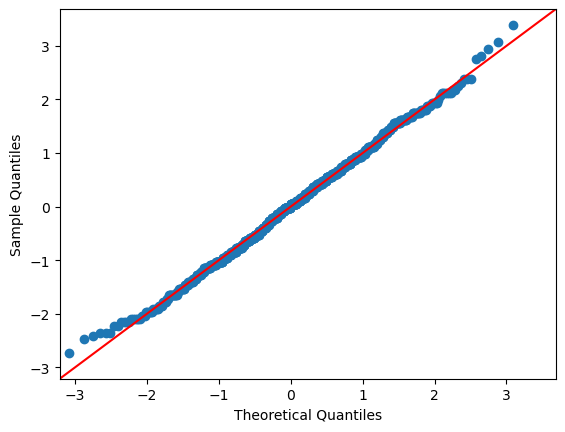

In [112]:
survivalProbListPos2 = []

for _ in range(1000): 
    
    survivalProbListPos2.append(survivalProb(211, 3000, 10, classmate_Matrix, friends_Matrix, True))

survivalProbListPos3 = [i/(1e20) for i in survivalProbListPos2 if i >= 0]

meanSurvivalProbPos3 = sum(survivalProbListPos3)/len(survivalProbListPos3)

ms3 = [(i-meanSurvivalProbPos3)**2 for i in survivalProbListPos3]

SSurvivalProbPos3 = (1/(len(survivalProbListPos3)-1) * sum(ms3))**(1/2)

survivalProbPosStandardised3 = np.array([(x-meanSurvivalProbPos3)/SSurvivalProbPos3 for x in survivalProbListPos3])

sm.qqplot(survivalProbPosStandardised3, line ='45')

plt.savefig ('test3.png')

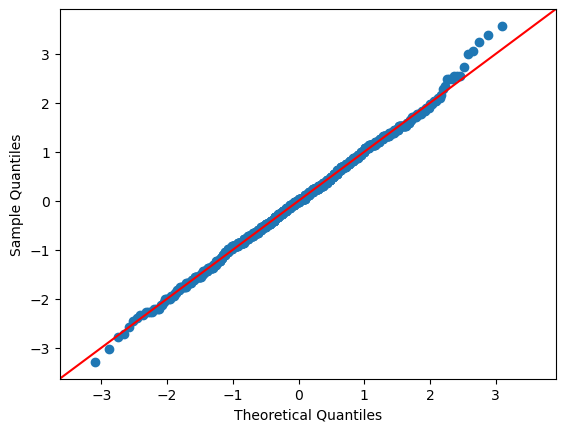

In [113]:
survivalProbListNeg2 = []

for _ in range(1000): 

        survivalProbListNeg2.append(survivalProb(211, 3000, 10, classmate_Matrix, friends_Matrix))

survivalProbListNeg3 = [i/(1e20) for i in survivalProbListNeg2 if i >= 0]

meanSurvivalProbNeg3 = sum(survivalProbListNeg3)/len(survivalProbListNeg3)

ms4 = [(i-meanSurvivalProbNeg3)**2 for i in survivalProbListNeg3]

SSurvivalProbNeg3 = (1/(len(survivalProbListNeg3)-1) * sum(ms4))**(1/2)

survivalProbNegStandardised3 = np.array([(x-meanSurvivalProbNeg3)/SSurvivalProbNeg3 for x in survivalProbListNeg3])

sm.qqplot(survivalProbNegStandardised3, line ='45')
    
plt.savefig('test4.png')

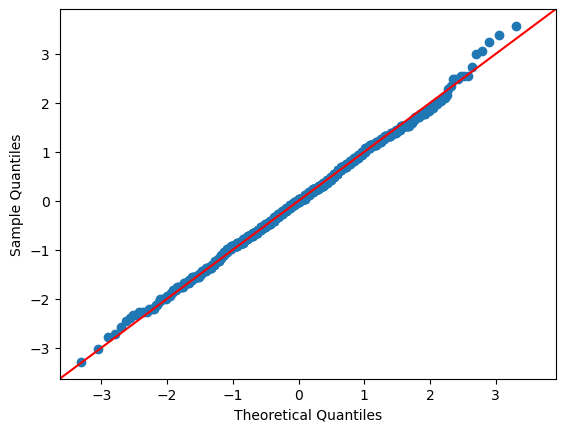

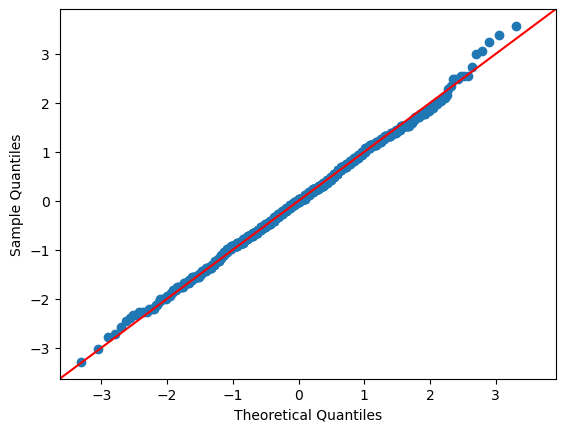

In [81]:
#Rumour Simulation with Num of Supporters

def supporter_Num(S, num, freq, temp, classmate_Matrix, friends_Matrix, positive = False, rumour_student = -1):
    
    supporterNum = []
    
    for _ in range(freq): 
        S = update_Step(S, num, temp, classmate_Matrix, friends_Matrix, positive, rumour_student)
        supporterNum.append(np.count_nonzero(S == -1))
        
    return supporterNum

def supportNum(num, freq, temp, classmate_Matrix, friends_Matrix, positive = False, rumour_student = -1): 
    p = 0
    Z = 0
    beta = 0
    if temp != 0: 
        beta = 1/(temp * 1.380649*10**(-23))     #Boltzmann Constant

    rand_num = rd.randint(0,2**num-1)

    S = [_ for _ in bin(rand_num)]
    S = [int(_) for _ in S[2:-1]]
    if rand_num%2 == 0: 
        S.append(0)
    else: 
        S.append(1)
    S = [-1 if _ == 0 else 1 for _ in S]
    while len(S) < num: 
        S.insert(0,-1)
    S = np.array(S)
    
    supporterNum = supporter_Num(S, num, freq, temp, classmate_Matrix, friends_Matrix, positive, rumour_student)
    
    return supporterNum



In [97]:
#Getting Data for graphs Bellow

rand_num = rd.randint(0,2**211-1)

S = [_ for _ in bin(rand_num)]
S = [int(_) for _ in S[2:-1]]
if rand_num%2 == 0: 
    S.append(0)
else: 
    S.append(1)
S = [-1 if _ == 0 else 1 for _ in S]
while len(S) < 211: 
    S.insert(0,-1)
S = np.array(S)

S1 = S.copy()
S2 = S.copy()
S3 = S.copy()
S4 = S.copy()

posTempSupporterNum1 = supporter_Num(S1, 211, 3000, 5, classmate_Matrix, friends_Matrix, True)
posTempSupporterNum2 = supporter_Num(S2, 211, 3000, 20, classmate_Matrix, friends_Matrix, True)

negTempSupporterNum1 = supporter_Num(S3, 211, 3000, 5, classmate_Matrix, friends_Matrix, False)
negTempSupporterNum2 = supporter_Num(S4, 211, 3000, 20, classmate_Matrix, friends_Matrix, False)


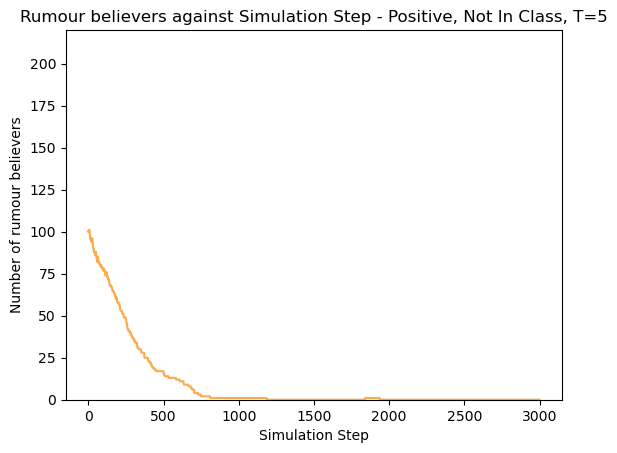

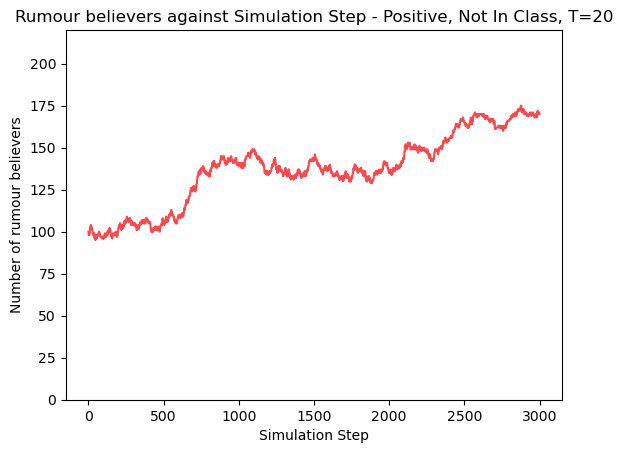

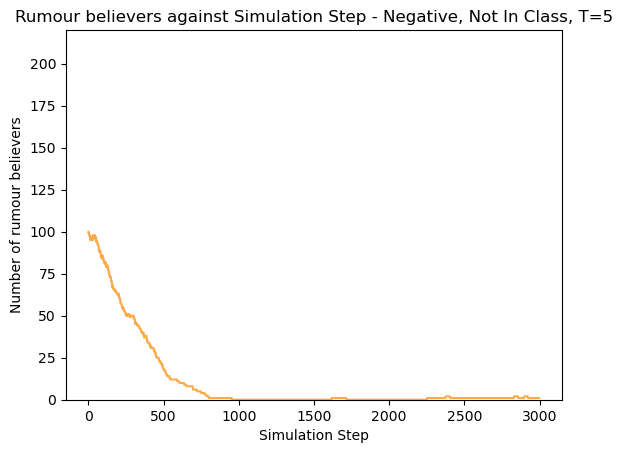

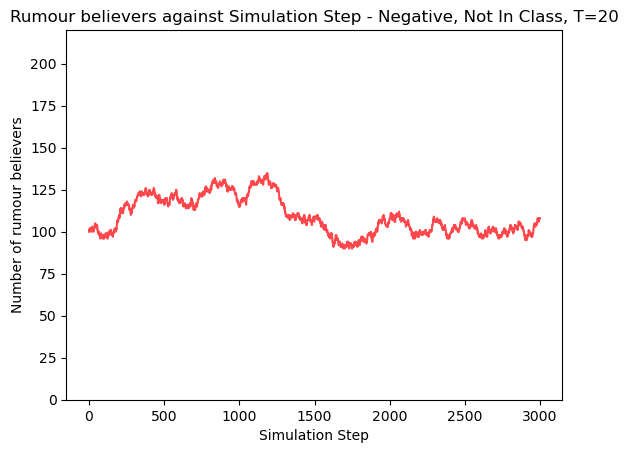

In [100]:
plt.subplots()
plt.plot(posTempSupporterNum1, color = '#fdaa48')
plt.ylim(0,220)
plt.xlabel('Simulation Step')
plt.ylabel('Number of rumour believers')
plt.title('Rumour believers against Simulation Step - Positive, Not In Class, T=5')
plt.savefig('Rumour believers against Simulation Step - Positive, Not In Class, T=5.png')

plt.subplots()
plt.plot(posTempSupporterNum2, color = '#ff474c')
plt.ylim(0,220)
plt.xlabel('Simulation Step')
plt.ylabel('Number of rumour believers')
plt.title('Rumour believers against Simulation Step - Positive, Not In Class, T=20')
plt.savefig('Rumour believers against Simulation Step - Positive, Not In Class, T=20.png')

plt.subplots()
plt.plot(negTempSupporterNum1, color = '#fdaa48')
plt.ylim(0,220)
plt.xlabel('Simulation Step')
plt.ylabel('Number of rumour believers')
plt.title('Rumour believers against Simulation Step - Negative, Not In Class, T=5')
plt.savefig('Rumour believers against Simulation Step - Negative, Not In Class, T=5.png')

plt.subplots()
plt.plot(negTempSupporterNum2, color = '#ff474c')
plt.ylim(0,220)
plt.xlabel('Simulation Step')
plt.ylabel('Number of rumour believers')
plt.title('Rumour believers against Simulation Step - Negative, Not In Class, T=20')
plt.savefig('Rumour believers against Simulation Step - Negative, Not In Class, T=20.png')


In [82]:
error_list_Pos = []
temp_list = [0.2*i for i in range(10,201)]

for temp in temp_list: 
    total = 0
    for _ in range(50): 
        supporterNumList = supportNum(211, 3000, temp, classmate_Matrix, friends_Matrix, True)
        difference_squared = (supporterNumList[-1]-supporterNumList[0])**2
        total += difference_squared
    total /= 50
    error_list_Pos.append(total)


In [83]:
error_list_Neg = []

for temp in temp_list: 
    total = 0
    for _ in range(50): 
        supporterNumList = supportNum(211, 3000, temp, classmate_Matrix, friends_Matrix, False)
        difference_squared = (supporterNumList[-1]-supporterNumList[0])**2
        total += difference_squared
    total /= 50
    error_list_Neg.append(total)

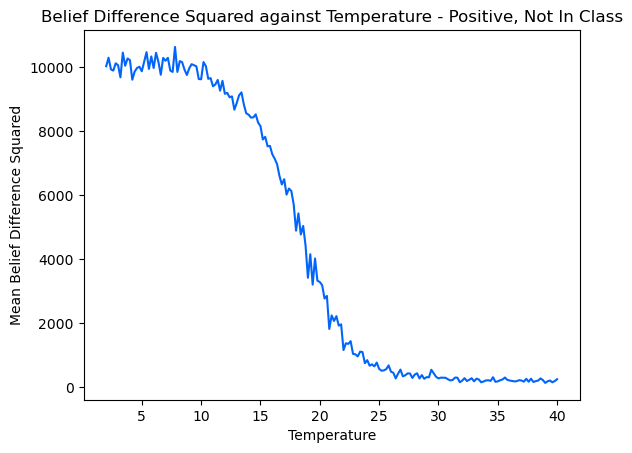

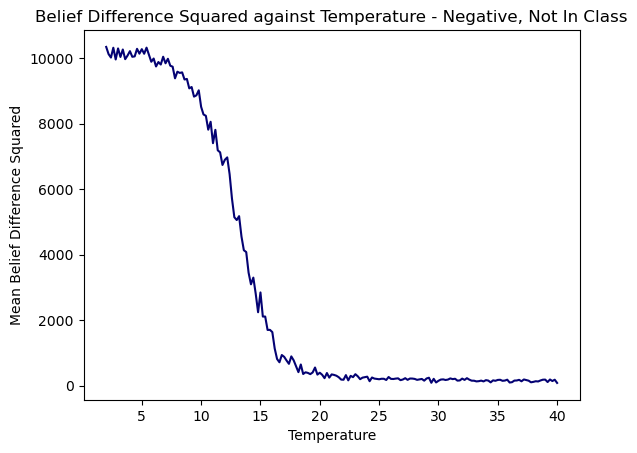

In [84]:
plt.subplots()
plt.plot(temp_list, error_list_Pos, color = '#0165fc')
plt.xlabel('Temperature')
plt.ylabel('Mean Belief Difference Squared')
plt.title('Belief Difference Squared against Temperature - Positive, Not In Class')
plt.savefig('Belief Difference Squared against Temperature - Positive, Not In Class.png')

plt.subplots()
plt.plot(temp_list, error_list_Neg, color = '#040273')
plt.xlabel('Temperature')
plt.ylabel('Mean Belief Difference Squared')
plt.title('Belief Difference Squared against Temperature - Negative, Not In Class')
plt.savefig('Belief Difference Squared against Temperature - Negative, Not In Class.png')

/var/folders/3p/w84v6ygx0s17b7n5xsxtgvt40000gn/T/ipykernel_45041/1253710578.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.subplots()


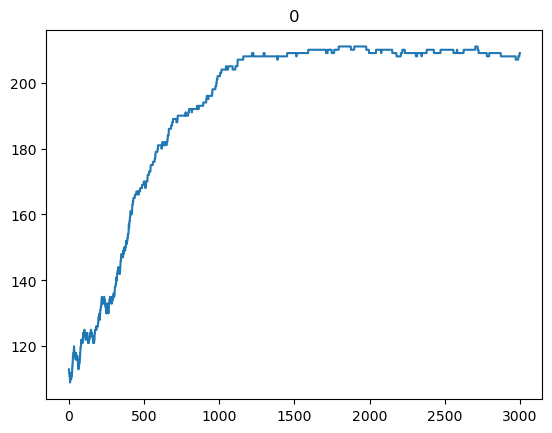

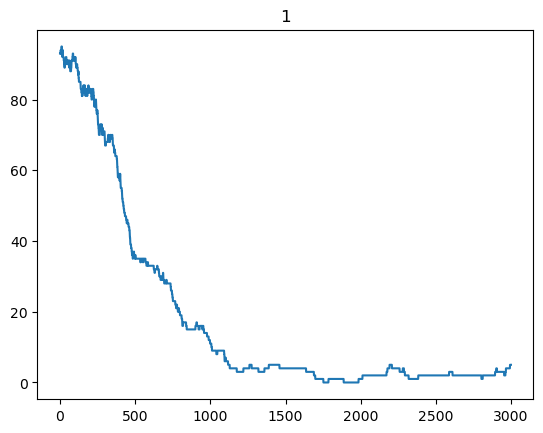

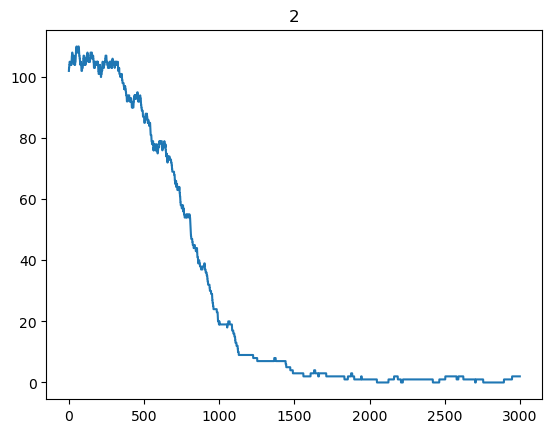

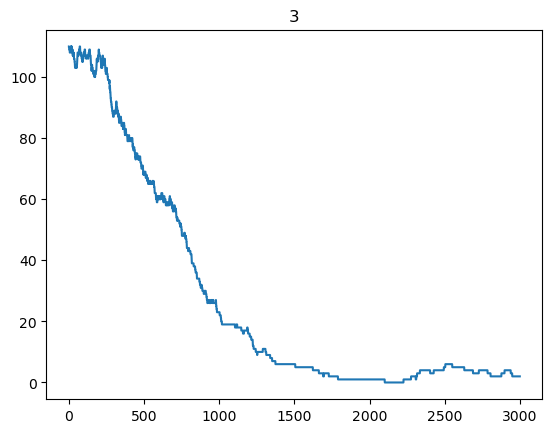

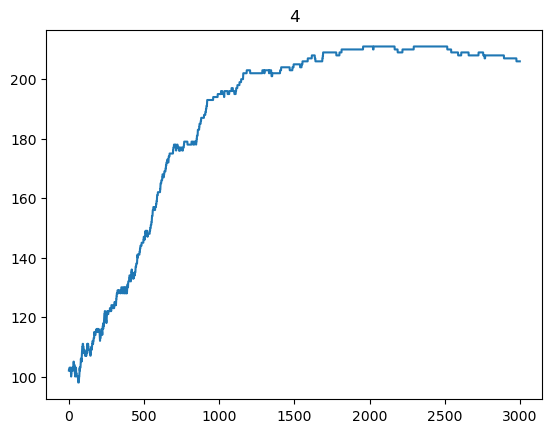

...

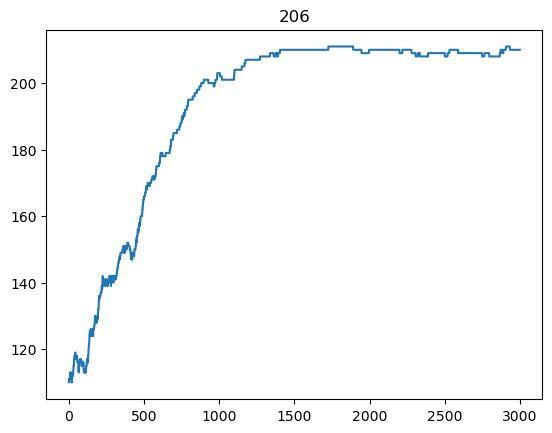

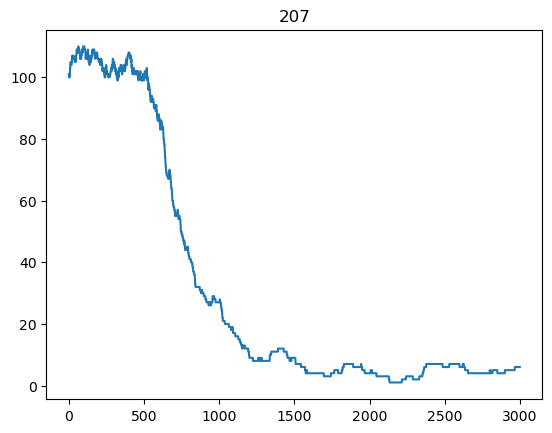

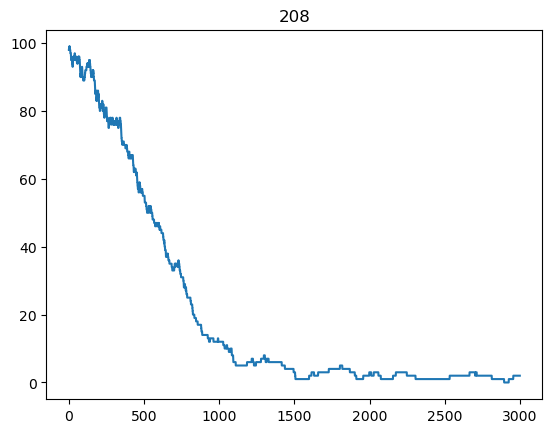

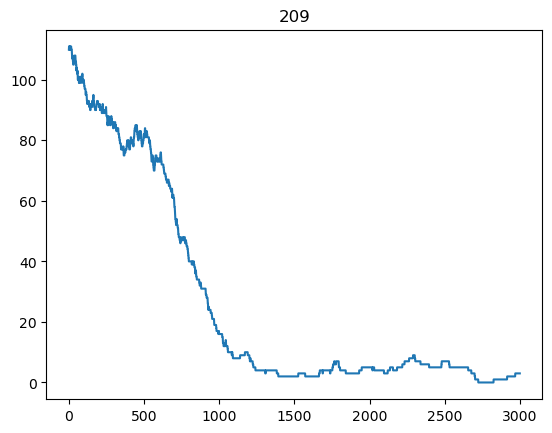

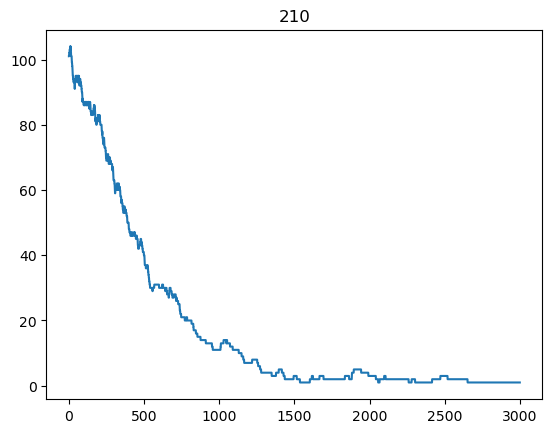

In [124]:
for student in range(211): 
    support_student_num_pos = supportNum(211, 3000, 10, classmate_Matrix, friends_Matrix, True, student)
    plt.subplots()
    plt.plot(support_student_num_pos)
    plt.title(student)
    


/var/folders/3p/w84v6ygx0s17b7n5xsxtgvt40000gn/T/ipykernel_45041/1802603976.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.subplots()


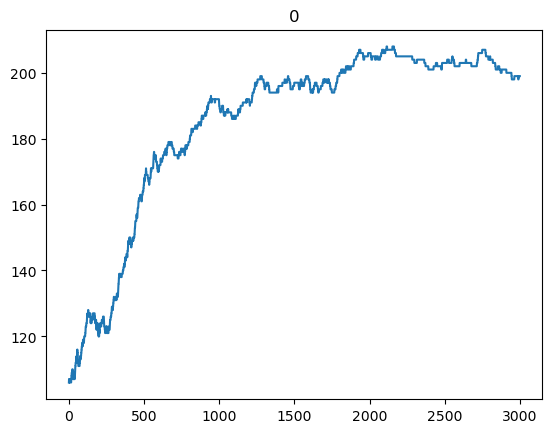

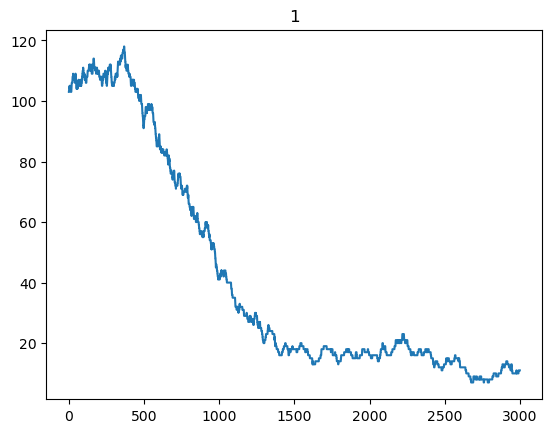

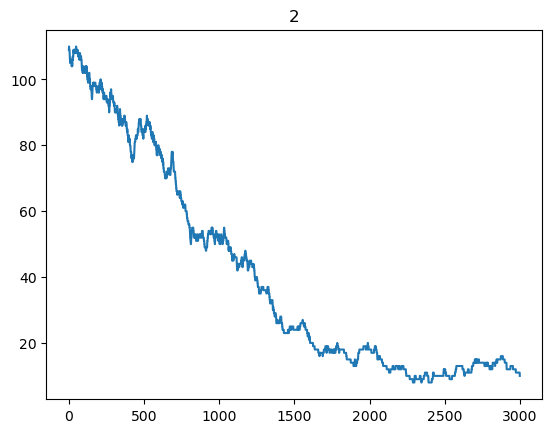

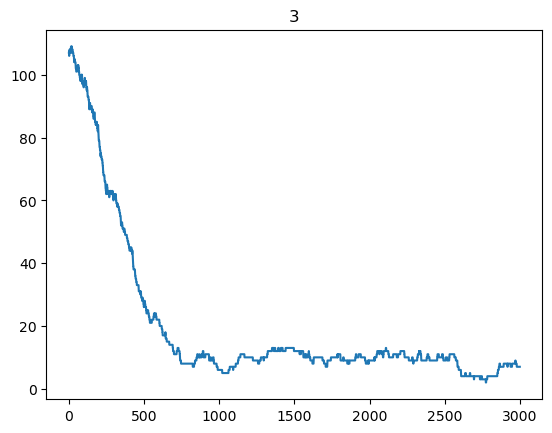

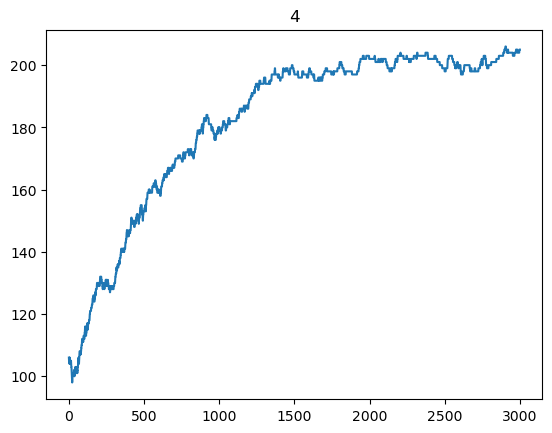

...

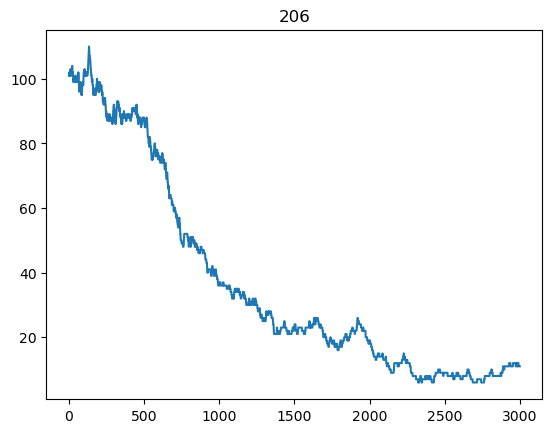

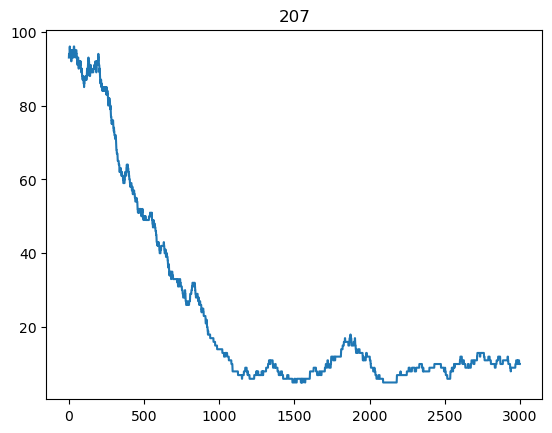

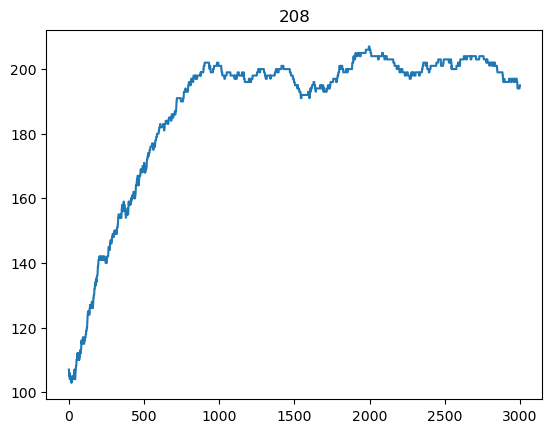

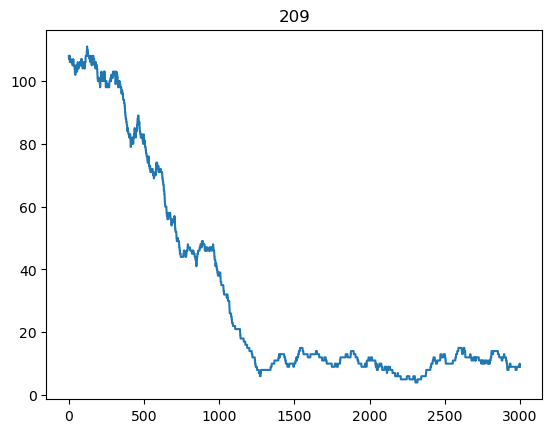

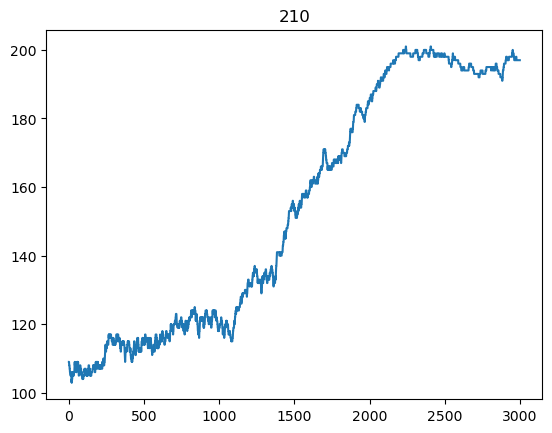

In [125]:
for student in range(211): 
    support_student_num_neg = supportNum(211, 3000, 10, classmate_Matrix, friends_Matrix, False, student)
    plt.subplots()
    plt.plot(support_student_num_neg)
    plt.title(student)